# Neural Networks and Deep Learning

University of Tehran

Author: Mohammad Taha Majlesi — Student ID: 810101504


# <a id='toc1_'></a>[Neural Networks and Deep Learning](#toc0_)
## <a id='toc1_1_'></a>[CA2 - Question 1](#toc0_)

**Table of contents**<a id='toc0_'></a>    
- [Neural Networks and Deep Learning](#toc1_)    
  - [CA2 - Question 1](#toc1_1_)    
- [Preparing the dataset](#toc2_)    
  - [Preprocess captions](#toc2_1_)    
  - [Create tokenizer](#toc2_2_)    
  - [Create the dataset](#toc2_3_)    
- [Create the model](#toc3_)    
  - [Create the encoder](#toc3_1_)    
  - [Create the decoder](#toc3_2_)    
  - [Merge encoder and decoder](#toc3_3_)    
- [Train and evaluate the models on validation dataset](#toc4_)    
  - [Model without dropout with embedding size of 50](#toc4_1_)    
  - [Model with dropout with embedding size of 50](#toc4_2_)    
  - [Model without teacher forcing](#toc5_)    
  - [Use a smaller dictionary](#toc6_)    
  - [Use embedding of size 150](#toc6_1_)    
  - [Use embedding of size 300](#toc6_2_)    
  - [Train on validation dataset for 40 epochs](#toc7_)    
- [Evaluate on test dataset](#toc8_)    

<!-- vscode-jupyter-toc-config
	numbering=false
	anchor=true
	flat=false
	minLevel=1
	maxLevel=6
	/vscode-jupyter-toc-config -->
<!-- THIS CELL WILL BE REPLACED ON TOC UPDATE. DO NOT WRITE YOUR TEXT IN THIS CELL -->

In [1]:
pip install torchinfo

Note: you may need to restart the kernel to use updated packages.


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader, Dataset, ConcatDataset
from nltk.translate.bleu_score import sentence_bleu, SmoothingFunction
from PIL import Image
import torch.nn as nn
import torchvision.models as models
from collections import defaultdict
from torchinfo import summary
import kagglehub
import torch
import os
import re
import json

2025-05-28 07:53:27.148368: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1748418807.336177      35 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1748418807.390973      35 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


# <a id='toc2_'></a>[Preparing the dataset](#toc0_)

In [3]:
path = kagglehub.dataset_download("adityajn105/flickr8k")
path

'/kaggle/input/'

In [4]:
captions_path = os.path.join(path,"captions.txt")
images_dir = os.path.join(path,"Images/")
file = open(captions_path, "r")
lines = file.readlines()
image_files = os.listdir(images_dir)

nsample = 3
samples = np.random.choice(len(os.listdir(images_dir)),nsample)
plt.figure(figsize=(10*nsample,10))
for i,idx in enumerate(samples):
  image_file = image_files[idx]
  img = Image.open(os.path.join(images_dir,image_file))
  caption = None
  for line in lines[1:]:
    line = line.strip().split(",",1)
    if(image_file == line[0]):
      caption = line[1]
      break

  plt.subplot(1,nsample,i+1)
  plt.imshow(img)
  plt.title(caption,fontsize=20)
  plt.axis('off')
file.close()

In [ ]:
len(image_files)

8091

## <a id='toc2_1_'></a>[Preprocess captions](#toc0_)

In [6]:
def preprocess_captions(path):
  file = open(path, "r")
  captions = defaultdict(list)

  lines = file.readlines()
  for line in lines[1:]:
      line = line.strip().split(",",1)
      caption = line[1].lower()
      caption = re.sub('[^a-z ]+', '', caption)[:-1]
      caption = ' '.join(caption.split())
      captions[line[0]].append(caption)

  file.close()
  return captions

In [7]:
np.random.seed(42)
captions = preprocess_captions(os.path.join(path,"captions.txt"))
shuffled_keys = np.random.permutation(list(captions.keys()))

test_ratio = 0.1
val_ratio = 0.1
num_val = int(val_ratio * len(captions))
num_test = int(test_ratio * len(captions))
num_train = len(captions) - num_val - num_test

train_captions = dict({key: captions[key] for key in shuffled_keys[:num_train]})
val_captions = dict({key: captions[key] for key in shuffled_keys[num_train:num_val+num_train]})
test_captions = dict({key: captions[key] for key in shuffled_keys[num_val+num_train:]})

In [ ]:
len(train_captions),len(val_captions),len(test_captions)

(6473, 809, 809)

## <a id='toc2_2_'></a>[Create tokenizer](#toc0_)

In [9]:
print("Max number of tokens in train captions:")
train_num_tokens = np.array([caption.count(" ")+1 for img in train_captions.values() for caption in img])
print(train_num_tokens.max())

print("Max number of tokens in validation captions:")
val_num_tokens = np.array([caption.count(" ")+1 for img in val_captions.values() for caption in img])
print(val_num_tokens.max())

print("Max number of tokens in test captions:")
test_num_tokens = np.array([caption.count(" ")+1 for img in test_captions.values() for caption in img])
print(test_num_tokens.max())

Max number of tokens in train captions:
35
Max number of tokens in validation captions:
30
Max number of tokens in test captions:
31


In [10]:
class special_tokens:
  Start = "<sos>"
  End = "<eos>"
  Pad = "<pad>"
  Unknown = "<unk>"
  list_of_tokens = [Start,End,Pad,Unknown]

class Tokenizer():
  def __init__(self, captions,unknown_percent=0.1, dictionary=None):
    self.unknown_percent = unknown_percent
    self.unknown_words = []
    self.context_length = max(caption.count(" ") for img in captions.values() for caption in img)+3
    self.total_tokens = 0
    self.total_unknown_tokens = 0
    if dictionary == None:
      self.dictionary = self._create_dictionary(train_captions)
      with open("tokenizer.json", "w") as f:
        json.dump(self.dictionary, f)
    else:
      self.dictionary = dictionary

  def _create_dictionary(self,targets):
    dictionary = dict({token:i for i,token in enumerate(special_tokens.list_of_tokens)})

    frequencies = defaultdict(int)
    for captions in targets.values():
      caption = " ".join(captions)
      tokens = caption.split(" ")
      for token in tokens:
        frequencies[token] += 1
        self.total_tokens += 1

    frequencies = sorted(list(frequencies.items()), key=lambda x: x[1])
    freq_threshold = frequencies[int(self.unknown_percent*len(frequencies))][1]
    for token, frequency in frequencies:
      if frequency <= freq_threshold:
        self.unknown_words.append((token, frequency))
        self.total_unknown_tokens += frequency
      else:
        dictionary[token] = len(dictionary)

    return dictionary

  def tokenize(self, text : str):
    return text.split(" ")

  def text_to_ids(self, text : str):
    tokens = self.tokenize(text)
    dictionary = self.dictionary
    ids = [dictionary[special_tokens.Pad] for _ in range(self.context_length)]
    ids[0] = dictionary[special_tokens.Start]

    for i in range(1,min(self.context_length-1,len(tokens)+1)):
      token = tokens[i-1]
      if token in dictionary:
        ids[i] = dictionary[token]
      else:
        ids[i] = dictionary[special_tokens.Unknown]

    ids[len(tokens)+1] = dictionary[special_tokens.End]
    return ids

  def ids_to_text(self, ids : list, ignore_special_tokens=False):
    if not ignore_special_tokens:
      return " ".join([list(self.dictionary.keys())[id] for id in ids])
    else:
      res = ""

      for id in ids:
        if id == special_tokens.End:
          break
        if id < len(special_tokens.list_of_tokens):
          continue

        res += list(self.dictionary.keys())[id]
        res += " "
      return res.strip()

In [11]:
tokenizer = Tokenizer(train_captions,unknown_percent=0.1)
len_dictionary = len(tokenizer.dictionary)
len_unk = len(tokenizer.unknown_words)
total_tokens = tokenizer.total_tokens
total_unknown_tokens = tokenizer.total_unknown_tokens
print("Numer of unqiue tokens in captions:",len_dictionary+len_unk)
print("Numer of tokens in dictionary:",len_dictionary)
print("Numer of unknown words in captions:",len_unk)
print("Percent of unknown tokens to all tokens in dictionary:",len_unk*100/(len_dictionary+len_unk))
print("Total number of tokens in captions:",total_tokens)
print("Percent of unknown tokens to all tokens in captions:",total_unknown_tokens*100/total_tokens)
print("List of some unknown words in captions:",tokenizer.unknown_words[:10])

Numer of unqiue tokens in captions: 8536
Numer of tokens in dictionary: 5017
Numer of unknown words in captions: 3519
Percent of unknown tokens to all tokens in dictionary: 41.22539831302718
Total number of tokens in captions: 349331
Percent of unknown tokens to all tokens in captions: 1.0073540567541959
List of some unknown words in captions: [('claws', 1), ('redseated', 1), ('largley', 1), ('exposition', 1), ('defaced', 1), ('bun', 1), ('blondhair', 1), ('headscarves', 1), ('hauled', 1), ('recked', 1)]


In [ ]:
text = list(train_captions.values())[0][0]
print("Text:",text)
ids = tokenizer.text_to_ids(text)
print("IDs:",ids)
output_text = tokenizer.ids_to_text(ids)
print("Output text with special tokens:",output_text)
output_text = tokenizer.ids_to_text(ids, True)
print("Output text without special tokens:",output_text)

Text: a blackandwhite dog bounds off the ground all feet in the air of a yellow field
IDs: [0, 5016, 2255, 5010, 3507, 4933, 5014, 4848, 4699, 4586, 5015, 5014, 4953, 5007, 5016, 4964, 4959, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2]
Output text with special tokens: <sos> a blackandwhite dog bounds off the ground all feet in the air of a yellow field <eos> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad>
Output text without special tokens: a blackandwhite dog bounds off the ground all feet in the air of a yellow field


## <a id='toc2_3_'></a>[Create the dataset](#toc0_)

In [13]:
class Flickr8kDataset(Dataset):
  def __init__(self, image_dir, captions, tokenizer, transform = None):
    self.images_dir = image_dir
    self.transform = transform
    self.captions = captions
    self.ids = defaultdict(list)
    for img in captions.keys():
      self.ids[img] = np.array([tokenizer.text_to_ids(caption) for caption in captions[img]])
    self.tokenizer = tokenizer
    self.image_files = list(captions.keys())

  def __len__(self):
    return len(self.image_files)

  def get_transform(self):
    return self.transform

  def set_transform(self, transform):
    self.transform = transform

  def __getitem__(self, index):
    image_file = self.image_files[index]
    image_path = os.path.join(self.images_dir,image_file)
    image = Image.open(image_path).convert('RGB')
    if self.transform:
      image = self.transform(image)
    ids = self.ids[image_file]
    return image, ids

[[   0 5016 2255 5010 3507 4933 5014 4848 4699 4586 5015 5014 4953 5007
  5016 4964 4959    1    2    2    2    2    2    2    2    2    2    2
     2    2    2    2    2    2    2    2    2]
 [   0 5016 5004 5011 5005 5010 5012 4976 4974 4828 4964 4975    1    2
     2    2    2    2    2    2    2    2    2    2    2    2    2    2
     2    2    2    2    2    2    2    2    2]
 [   0 5016 5004 5011 5005 5010 5012 4976 4986 5016 4959 5007 4992 4975
     1    2    2    2    2    2    2    2    2    2    2    2    2    2
     2    2    2    2    2    2    2    2    2]
 [   0 5016 5010 4944 4986 5014 4550 4975    1    2    2    2    2    2
     2    2    2    2    2    2    2    2    2    2    2    2    2    2
     2    2    2    2    2    2    2    2    2]
 [   0 5014 5004 5011 5005 5010 4944 4986 5014 4959    1    2    2    2
     2    2    2    2    2    2    2    2    2    2    2    2    2    2
     2    2    2    2    2    2    2    2    2]]
<sos> a blackandwhite dog bounds off th

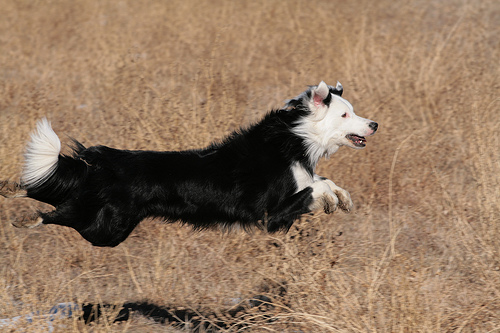

In [14]:
loader = Flickr8kDataset(os.path.join(path,"Images"),train_captions, tokenizer)
image,captions = loader[0]
print(captions)
print(tokenizer.ids_to_text(captions[0]))
image

In [15]:
weights = models.ResNet50_Weights.DEFAULT
transform = weights.transforms()

In [ ]:
train_dataset = Flickr8kDataset(os.path.join(path,"Images"),train_captions,tokenizer,transform = transform)
val_dataset = Flickr8kDataset(os.path.join(path,"Images"),val_captions,tokenizer,transform = transform)
test_dataset = Flickr8kDataset(os.path.join(path,"Images"),test_captions,tokenizer,transform = transform)

# <a id='toc3_'></a>[Create the model](#toc0_)

## <a id='toc3_1_'></a>[Create the encoder](#toc0_)

In [17]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [18]:
resnet = models.resnet50(weights=weights)

Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 203MB/s]


In [19]:
resnet

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [20]:
class Encoder(nn.Module):
  def __init__(self):
    super(Encoder, self).__init__()
    resnet = models.resnet50(weights=weights)
    modules = list(resnet.children())[:-1]
    encoder = nn.Sequential(*modules)
    for param in encoder.parameters():
        param.requires_grad = False
    self.encoder = encoder

  def forward(self, x):
    x = self.encoder(x)
    x = x.view(x.size(0), -1)
    return x

In [ ]:
encoder = Encoder()
dummy_input = torch.randn(1, 3, 224, 224)
features = encoder(dummy_input)
features.shape

torch.Size([1, 2048])

## <a id='toc3_2_'></a>[Create the decoder](#toc0_)

In [ ]:
class Decoder(nn.Module):
  def __init__(self, vocab_size, embedding_dim, hidden_size, device):
    super(Decoder, self).__init__()
    self.hidden_size = hidden_size
    self.vocab_size = vocab_size
    self.device = device

    self.embedding = nn.Embedding(vocab_size, embedding_dim)
    self.lstm_cell = nn.LSTMCell(
      input_size=embedding_dim,
      hidden_size=hidden_size,
    )
    self.gru_cell = nn.GRUCell(
      input_size=hidden_size,
      hidden_size=hidden_size,
    )
    self.linear = nn.Linear(in_features=hidden_size, out_features=vocab_size)
    self.dropout = nn.Dropout(0.5)

  def forward(self, features, captions):
    batch_size = features.size(0)
    lstm_hidden = features
    lstm_cell = features
    gru_hidden = features
    outputs = torch.empty((batch_size,captions.size(1)-1,self.vocab_size), device=self.device)
    embeddings = self.embedding(captions)
    embeddings = self.dropout(embeddings)

    for t in range(1,captions.size(1)):
      lstm_hidden, lstm_cell = self.lstm_cell(embeddings[:,t-1,:], (lstm_hidden, lstm_cell))
      lstm_cell = self.dropout(lstm_cell)
      gru_hidden = self.gru_cell(lstm_cell, gru_hidden)
      gru_hidden = self.dropout(gru_hidden)
      outputs[:,t-1,:] = self.linear(gru_hidden)
    return outputs

  def generate_greedy(self, features, max_new_tokens):
    batch_size = features.size(0)
    lstm_hidden = features
    lstm_cell = features
    gru_hidden = features
    outputs = torch.zeros((batch_size,max_new_tokens), dtype=torch.int, device=self.device)

    for t in range(1,max_new_tokens):
      outs = self.embedding(outputs[:,t-1])
      lstm_hidden, lstm_cell = self.lstm_cell(outs, (lstm_hidden, lstm_cell))
      gru_hidden = self.gru_cell(lstm_cell, gru_hidden)
      outputs[:,t] = self.linear(gru_hidden).argmax(dim=-1)
    return outputs

  def generate_beam_search(self, features, beam_width, max_new_tokens):
    B = features.size(0)
    K = beam_width
    V = self.vocab_size
    H = self.hidden_size
    T = max_new_tokens

    lstm_hidden = features.unsqueeze(1).repeat(1, K, 1).view(-1, H)
    lstm_cell = features.unsqueeze(1).repeat(1, K, 1).view(-1, H)
    gru_hidden = features.unsqueeze(1).repeat(1, K, 1).view(-1, H)

    outputs = torch.zeros((B * K, T), dtype=torch.int, device=self.device)

    outs = self.embedding(outputs[:, 0])
    lstm_hidden, lstm_cell = self.lstm_cell(outs, (lstm_hidden, lstm_cell))
    gru_hidden = self.gru_cell(lstm_cell, gru_hidden)
    log_probs = torch.log_softmax(self.linear(gru_hidden), dim=-1)

    total_scores = log_probs.view(B, K, V)[:, 0, :]
    top_scores, token_indices = total_scores.topk(K, dim=-1)

    outputs[:, 1] = token_indices.view(-1)

    beam_scores = top_scores.view(-1, 1)

    for t in range(2,T):
        outs = self.embedding(outputs[:,t-1])
        lstm_hidden, lstm_cell = self.lstm_cell(outs, (lstm_hidden, lstm_cell))
        gru_hidden = self.gru_cell(lstm_cell, gru_hidden)

        log_probs = torch.log_softmax(self.linear(gru_hidden), dim=-1)
        total_scores = beam_scores.view(B, K, 1) + log_probs.view(B, K, V)
        total_scores = total_scores.view(B, -1)

        top_scores, top_indices = total_scores.topk(K, dim=-1)
        beam_indices = top_indices // V
        token_indices = top_indices % V

        flat_old_indices = (torch.arange(B, device=self.device).unsqueeze(1) * K + beam_indices).view(-1)
        outputs = outputs[flat_old_indices]
        outputs[:, t] = token_indices.view(-1)

        lstm_hidden = lstm_hidden[flat_old_indices]
        lstm_cell = lstm_cell[flat_old_indices]
        gru_hidden = gru_hidden[flat_old_indices]
        beam_scores = top_scores

    best_beam = beam_scores.argmax(dim=1)
    final_outputs = outputs.view(B, K, T)
    best_outputs = final_outputs[torch.arange(B), best_beam]
    return best_outputs

## <a id='toc3_3_'></a>[Merge encoder and decoder](#toc0_)

In [23]:
class HybridModel(nn.Module):
  def __init__(self, vocab_size, embedding_dim, hidden_size, device):
    super(HybridModel, self).__init__()
    self.encoder = Encoder()
    self.decoder = Decoder(vocab_size, embedding_dim, hidden_size, device)

  def forward(self, images, captions):
    features = self.encoder(images)

    features = features.unsqueeze(1).repeat(1, captions.shape[1], 1)
    features = features.view(-1,features.shape[-1])
    captions = captions.view(-1, captions.shape[-1])

    return self.decoder(features, captions)

  def generate_greedy(self, images, max_new_tokens):
    features = self.encoder(images)
    return self.decoder.generate_greedy(features, max_new_tokens)

  def generate_beam_search(self, images, beam_width, max_new_tokens):
    features = self.encoder(images)
    return self.decoder.generate_beam_search(features, beam_width, max_new_tokens)

In [24]:
vocab_size = len(tokenizer.dictionary)
embedding_dim = 50
hidden_size = 2048
model = HybridModel(vocab_size,embedding_dim,hidden_size,device).to(device)

In [25]:
sum([np.prod(p.size()) for p in model.parameters() if p.requires_grad])

52911995

In [26]:
dummy_input = torch.randn(2, 3, 224, 224).to(device)
dummy_caption = torch.randint(0, 100, (2,3, 37)).long().to(device)
dummy_caption.shape

torch.Size([2, 3, 37])

In [27]:
o = model(dummy_input,dummy_caption)
o.shape

torch.Size([6, 36, 5017])

In [28]:
texts = model.generate_greedy(dummy_input, 10)
for text in texts:
  print(tokenizer.ids_to_text(text))

<sos> off company ridden backyard backyard midleap crevice crevice sky
<sos> company draw ridden suburban olympics throught throught plugging plugging


In [29]:
texts = model.generate_beam_search(dummy_input, 2, 10)
for text in texts:
  print(tokenizer.ids_to_text(text))

<sos> change company backyard backyard crevice dribbling dribbling tophats indoors
<sos> waiting company lightcolored lightcolored chested guiding sniffs location region


In [30]:
model

HybridModel(
  (encoder): Encoder(
    (encoder): Sequential(
      (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (4): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (relu): ReLU(inplace=True)
      

In [ ]:
summary(model, input_data=(dummy_input, dummy_caption))

Layer (type:depth-idx)                             Output Shape              Param #
HybridModel                                        [6, 36, 5017]             --
├─Encoder: 1-1                                     [2, 2048]                 --
│    └─Sequential: 2-1                             [2, 2048, 1, 1]           --
│    │    └─Conv2d: 3-1                            [2, 64, 112, 112]         (9,408)
│    │    └─BatchNorm2d: 3-2                       [2, 64, 112, 112]         (128)
│    │    └─ReLU: 3-3                              [2, 64, 112, 112]         --
│    │    └─MaxPool2d: 3-4                         [2, 64, 56, 56]           --
│    │    └─Sequential: 3-5                        [2, 256, 56, 56]          (215,808)
│    │    └─Sequential: 3-6                        [2, 512, 28, 28]          (1,219,584)
│    │    └─Sequential: 3-7                        [2, 1024, 14, 14]         (7,098,368)
│    │    └─Sequential: 3-8                        [2, 2048, 7, 7]           (14,9

# <a id='toc4_'></a>[Train and evaluate the models on validation dataset](#toc0_)

## <a id='toc4_1_'></a>[Model without dropout with embedding size of 50](#toc0_)

In [32]:
# from google.colab import drive
# drive.mount('/content/drive')
# path = '/content/drive/MyDrive/Colab/NNDL/CA4/Part1/Models/'

In [ ]:
def train_epoch(model, data_loader, criterion, optimizer, device):
  model.train()
  total_loss = 0
  num_batches = len(data_loader)

  for batch_idx, (images, caption) in enumerate(data_loader):
    images = images.to(device)
    caption = caption.to(device)
    optimizer.zero_grad()

    predictions = model(images, caption)
    caption = caption[:,:,1:]
    predictions = predictions.view(-1, predictions.size(-1))
    caption = caption.reshape(-1)

    loss = criterion(predictions, caption)

    loss.backward()
    optimizer.step()

    total_loss += loss.item()

  return total_loss / num_batches

def validation_epoch(model, data_loader, criterion, device, scheduler = None):
  model.eval()
  total_loss = 0
  num_batches = len(data_loader)

  with torch.no_grad():
    for batch_idx, (images, caption) in enumerate(data_loader):
      images = images.to(device)
      caption = caption.to(device)

      predictions = model(images, caption)
      caption = caption[:,:,1:]
      predictions = predictions.view(-1, predictions.size(-1))
      caption = caption.reshape(-1)

      loss = criterion(predictions, caption)

      total_loss += loss.item()

  if scheduler != None:
    scheduler.step(total_loss / num_batches)

  return total_loss / num_batches

In [ ]:
def train(model, train_loader, val_loader, criterion, optimizer, epochs, device, scheduler = None):
  hist = {
      "train_loss": [],
      "val_loss": [],
  }

  for epoch in range(1, epochs + 1):
    train_loss = train_epoch(model, train_loader, criterion, optimizer, device)
    hist['train_loss'].append(train_loss)
    print(f"Epoch [{epoch}] Average Training Loss: {train_loss:.4f}")

    val_loss = validation_epoch(model, val_loader, criterion, optimizer, device, scheduler)
    hist['val_loss'].append(val_loss)
    print(f"Epoch [{epoch}] Average Validation Loss: {val_loss:.4f}")

  return hist

In [35]:
batch_size = 32
epochs = 10
learning_rate = 0.001

In [36]:
train_loader = DataLoader(
    train_dataset,
    batch_size=batch_size,
    shuffle=True)
val_loader = DataLoader(
    val_dataset,
    batch_size=batch_size,
    shuffle=False)

In [131]:
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
criterion = nn.CrossEntropyLoss(ignore_index=tokenizer.dictionary[special_tokens.Pad])

In [ ]:
hist = train(model, train_loader, val_loader, criterion, optimizer, epochs, device)

Epoch [1] Average Training Loss: 4.1276
Epoch [1] Average Validation Loss: 3.2930
Epoch [2] Average Training Loss: 3.0185
Epoch [2] Average Validation Loss: 2.9960
Epoch [3] Average Training Loss: 2.5076
Epoch [3] Average Validation Loss: 2.9140
Epoch [4] Average Training Loss: 2.0589
Epoch [4] Average Validation Loss: 2.9189
Epoch [5] Average Training Loss: 1.6567
Epoch [5] Average Validation Loss: 3.0184
Epoch [6] Average Training Loss: 1.2900
Epoch [6] Average Validation Loss: 3.1241
Epoch [7] Average Training Loss: 0.9721
Epoch [7] Average Validation Loss: 3.2713
Epoch [8] Average Training Loss: 0.7186
Epoch [8] Average Validation Loss: 3.3975
Epoch [9] Average Training Loss: 0.5491
Epoch [9] Average Validation Loss: 3.5529
Epoch [10] Average Training Loss: 0.4542
Epoch [10] Average Validation Loss: 3.6487


In [37]:
def plot_history(history):
    epochs = len(history['train_loss'])
    plt.plot(range(1,epochs+1), history['train_loss'])
    plt.plot(range(1,epochs+1), history['val_loss'])
    plt.title('Loss of model')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Validation/Test'])
    plt.ylim(0, max(max(history['train_loss']),max(history['val_loss'])))
    plt.show()

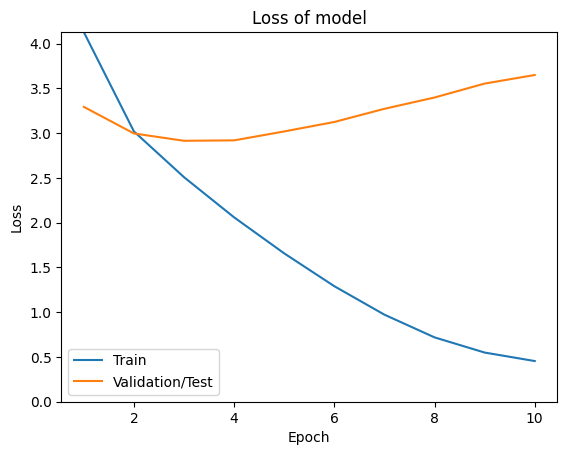

In [ ]:
plot_history(hist)

In [38]:
def plot_generations(model, tokenizer, beam_widths, nsample, val_dataset, max_new_tokens):
    transform = val_dataset.get_transform()
    val_dataset.set_transform(transform=None)

    fig = plt.figure(figsize=(8,18))
    fig, axes = plt.subplots(5, 2, figsize=(14, 3.5 * 5))

    for i in range(nsample):
        image, captions = val_dataset[i]
        transformed_image = transform(image)

        lines = []
        ref_text = tokenizer.ids_to_text(captions[0], ignore_special_tokens=True)
        lines.append(f"True: {ref_text}")

        greedy = model.generate_greedy(transformed_image.unsqueeze(0).to(device), max_new_tokens)
        greedy_text = tokenizer.ids_to_text(greedy[0], ignore_special_tokens=True)
        lines.append(f"Greedy: {greedy_text}")

        for width in beam_widths:
            beam = model.generate_beam_search(transformed_image.unsqueeze(0).to(device), width, max_new_tokens)
            beam_text = tokenizer.ids_to_text(beam[0], ignore_special_tokens=True)
            lines.append(f"Beam (K={width}): {beam_text}")

        axes[i][0].imshow(image)
        axes[i][0].axis('off')

        axes[i][1].axis('off')
        full_text = "\n\n".join(lines)
        axes[i][1].text(0, 1, full_text,fontsize=10,va='top',ha='left',wrap=True,
            transform=axes[i][1].transAxes)

    plt.tight_layout()
    val_dataset.set_transform(transform)
    plt.show()

<Figure size 800x1800 with 0 Axes>

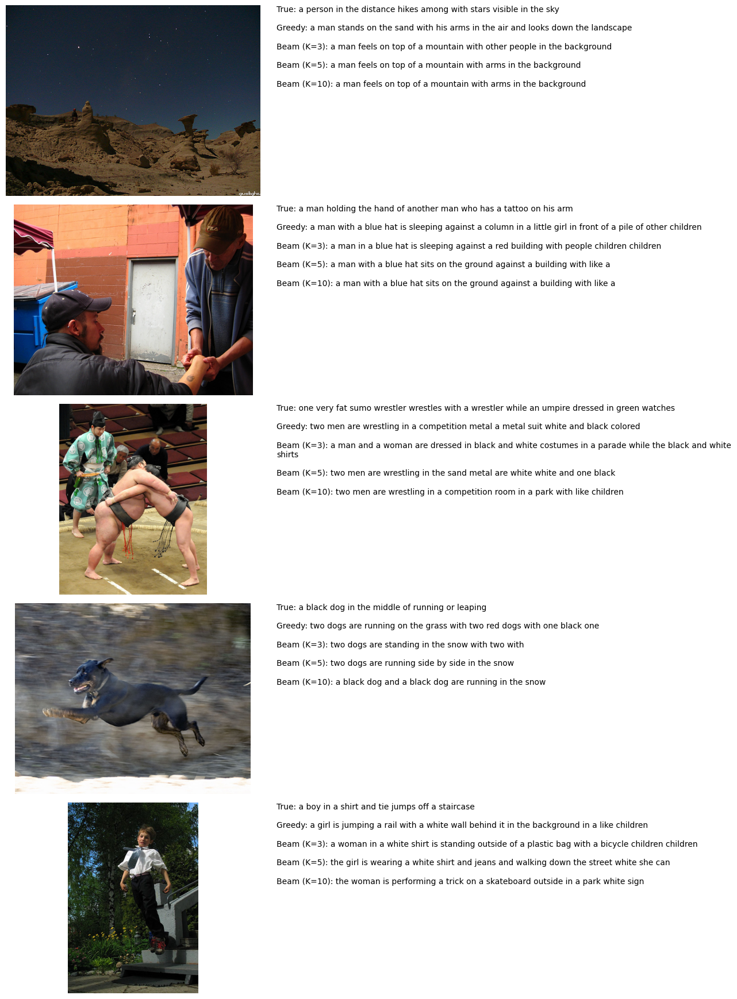

In [ ]:
beam_widths = [3,5,10]
nsample = 5
max_new_tokens = tokenizer.context_length+3
plot_generations(model, tokenizer, beam_widths, nsample, val_dataset, max_new_tokens)

In [39]:
def evaluate(model, tokenizer, data_loader, beam_widths, max_new_tokens):
    def accuracy_score(captions, generated):
        generated = generated.tolist()
        best_correct = 0
        best_total = 1e-9

        end_token = tokenizer.dictionary[special_tokens.End]
        len_generated = len(generated)
        if end_token in generated:
            len_generated = generated.index(end_token)

        for caption in captions:
            len_caption = len(caption)
            if end_token in caption:
                len_caption = caption.index(end_token)
            correct = [(generated[i] == caption[i]) for i in range(1,min(len_caption,len_generated))]

            if sum(correct) > best_correct:
                best_correct = sum(correct)
                best_total = len_caption
        return best_correct, best_total


    scores = defaultdict(lambda: defaultdict(float))
    count = 0
    smooth = SmoothingFunction().method1

    for batch_idx, (images, captions) in enumerate(data_loader):
      images = images.to(device)
      captions = captions.tolist()
      new_captions = []
      count += len(captions)

      greedy_ids = model.generate_greedy(images,max_new_tokens)
      greedy = [tokenizer.ids_to_text(t,ignore_special_tokens=True) for t in greedy_ids]
      greedy = [tokenizer.tokenize(t) for t in greedy]

      for b in range(len(greedy)):
        caption = captions[b]
        best_correct, best_total = accuracy_score(caption, greedy_ids[b])
        scores['Greedy']['Micro Accuracy'] += best_correct
        scores['Greedy']['Total Tokens'] += best_total
        scores['Greedy']['Macro Accuracy'] += best_correct / best_total

        caption = [tokenizer.ids_to_text(t,ignore_special_tokens=True) for t in caption]
        caption = [tokenizer.tokenize(t) for t in caption]
        new_captions.append(caption)

        scores['Greedy']['BLEU-1'] += sentence_bleu(caption, greedy[b], weights=(1, 0, 0, 0), smoothing_function=smooth)
        scores['Greedy']['BLEU-2'] += sentence_bleu(caption, greedy[b], weights=(0.5, 0.5, 0, 0), smoothing_function=smooth)
        scores['Greedy']['BLEU-3'] += sentence_bleu(caption, greedy[b], weights=(0.33, 0.33, 0.33, 0), smoothing_function=smooth)
        scores['Greedy']['BLEU-4'] += sentence_bleu(caption, greedy[b], weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smooth)

      for width in beam_widths:
        beam_ids = model.generate_beam_search(images,width,max_new_tokens)
        beam = [tokenizer.ids_to_text(t,ignore_special_tokens=True) for t in beam_ids]
        beam = [tokenizer.tokenize(t) for t in beam]

        for b in range(len(greedy)):
          best_correct, best_total = accuracy_score(captions[b], beam_ids[b])
          caption = new_captions[b]
          scores['Beam '+f"K = {width}"]['Micro Accuracy'] += best_correct
          scores['Beam '+f"K = {width}"]['Total Tokens'] += best_total
          scores['Beam '+f"K = {width}"]['Macro Accuracy'] += best_correct / best_total
          scores['Beam '+f"K = {width}"]['BLEU-1'] += sentence_bleu(caption, beam[b], weights=(1, 0, 0, 0), smoothing_function=smooth)
          scores['Beam '+f"K = {width}"]['BLEU-2'] += sentence_bleu(caption, beam[b], weights=(0.5, 0.5, 0, 0), smoothing_function=smooth)
          scores['Beam '+f"K = {width}"]['BLEU-3'] += sentence_bleu(caption, beam[b], weights=(0.33, 0.33, 0.33, 0), smoothing_function=smooth)
          scores['Beam '+f"K = {width}"]['BLEU-4'] += sentence_bleu(caption, beam[b], weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smooth)

    final = {}
    for method, metrics in scores.items():
        total_tokens = metrics.pop('Total Tokens', 1)
        final[method] = {k: v / count for k, v in metrics.items()}
        final[method]['Micro Accuracy'] = scores[method]['Micro Accuracy'] / total_tokens

    return pd.DataFrame(final).T

In [ ]:
evaluate(model, tokenizer, val_loader, beam_widths, max_new_tokens)

,Micro Accuracy,Macro Accuracy,BLEU-1,BLEU-2,BLEU-3,BLEU-4
Greedy,0.208325,0.214487,0.434335,0.254904,0.146316,0.087936
Beam K = 3,0.218159,0.218958,0.442262,0.266012,0.157038,0.096279
Beam K = 5,0.210859,0.211694,0.450165,0.272289,0.161610,0.098869
Beam K = 10,0.210317,0.211630,0.451148,0.275044,0.163723,0.100048


## <a id='toc4_2_'></a>[Model with dropout with embedding size of 50](#toc0_)

In [ ]:
vocab_size = len(tokenizer.dictionary)
embedding_dim = 50
hidden_size = 2048
model_with_dropout = HybridModel(vocab_size,embedding_dim,hidden_size,device).to(device)

In [ ]:
optimizer = torch.optim.Adam(model_with_dropout.parameters(), lr=learning_rate)
criterion = nn.CrossEntropyLoss(ignore_index=tokenizer.dictionary[special_tokens.Pad])

Epoch [1] Average Training Loss: 4.4957
Epoch [1] Average Validation Loss: 3.6234
Epoch [2] Average Training Loss: 3.7566
Epoch [2] Average Validation Loss: 3.3422
Epoch [3] Average Training Loss: 3.4879
Epoch [3] Average Validation Loss: 3.2289
Epoch [4] Average Training Loss: 3.3041
Epoch [4] Average Validation Loss: 3.1312
Epoch [5] Average Training Loss: 3.1722
Epoch [5] Average Validation Loss: 3.0872
Epoch [6] Average Training Loss: 3.0759
Epoch [6] Average Validation Loss: 3.0786
Epoch [7] Average Training Loss: 3.0124
Epoch [7] Average Validation Loss: 3.0254
Epoch [8] Average Training Loss: 2.8838
Epoch [8] Average Validation Loss: 2.9977
Epoch [9] Average Training Loss: 2.8131
Epoch [9] Average Validation Loss: 3.0303
Epoch [10] Average Training Loss: 2.7661
Epoch [10] Average Validation Loss: 2.9930


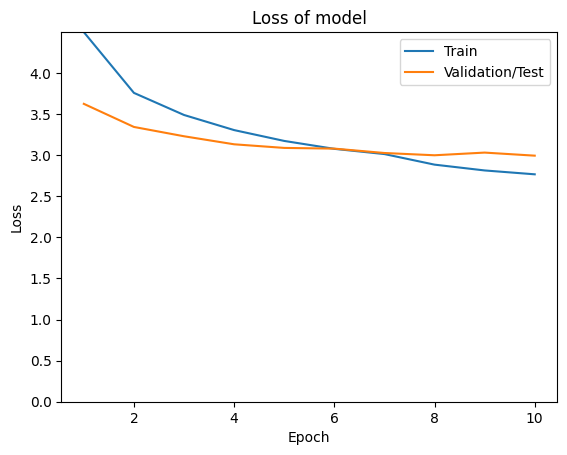

In [ ]:
epochs = 10
hist_with_dropout = train(model_with_dropout, train_loader, val_loader, criterion, optimizer, epochs, device)
plot_history(hist_with_dropout)

<Figure size 800x1800 with 0 Axes>

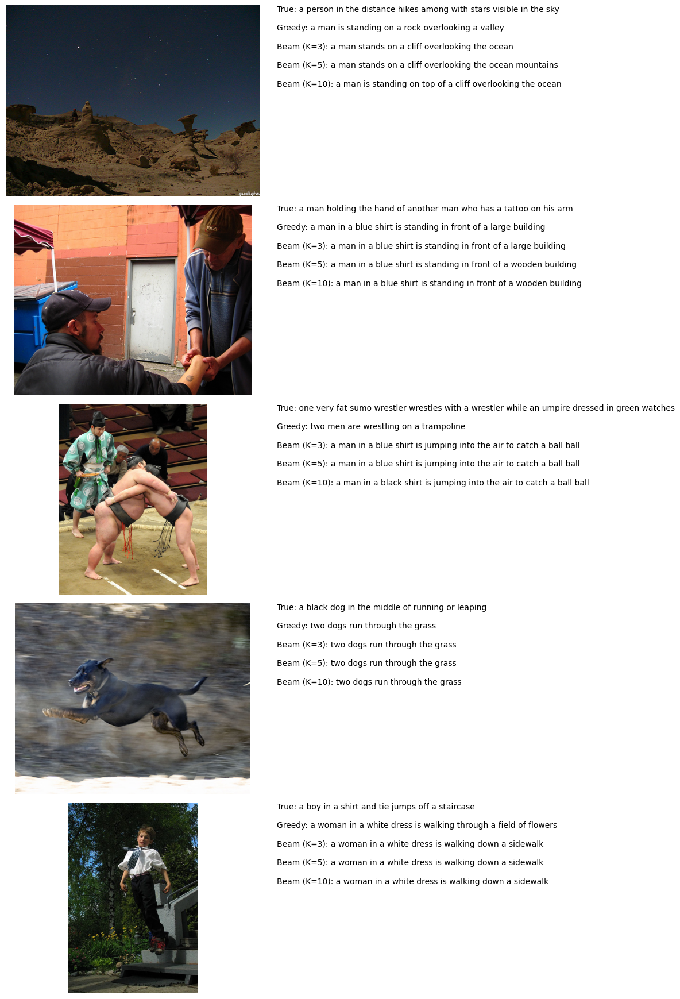

In [ ]:
beam_widths = [3,5,10]
nsample = 5
max_new_tokens = tokenizer.context_length+3
plot_generations(model_with_dropout, tokenizer, beam_widths, nsample, val_dataset, max_new_tokens)

In [ ]:
evaluate(model_with_dropout, tokenizer, val_loader, beam_widths, max_new_tokens)

,Micro Accuracy,Macro Accuracy,BLEU-1,BLEU-2,BLEU-3,BLEU-4
Greedy,0.232908,0.243318,0.570553,0.381970,0.245657,0.157948
Beam K = 3,0.238769,0.247726,0.570572,0.382528,0.248707,0.161953
Beam K = 5,0.237850,0.247339,0.568306,0.380303,0.246676,0.158369
Beam K = 10,0.235818,0.244766,0.558266,0.369942,0.237431,0.152409


## <a id='toc5_'></a>[Model without teacher forcing](#toc0_)

In [103]:
class DecoderNoTeacherForcing(Decoder):
  def __init__(self, vocab_size, embedding_dim, hidden_size, device):
    super(DecoderNoTeacherForcing, self).__init__(vocab_size, embedding_dim, hidden_size, device)

  def forward(self, features, captions):
    batch_size = features.size(0)
    lstm_hidden = features
    lstm_cell = features
    gru_hidden = features
    outputs = torch.empty((batch_size,captions.size(1)-1,self.vocab_size), device=self.device)
    tokens = torch.zeros((batch_size,1), dtype=torch.int, device=self.device)

    for t in range(1,captions.size(1)):
      embeddings = self.embedding(tokens)[:,0,:]
      embeddings = self.dropout(embeddings)
      lstm_hidden, lstm_cell = self.lstm_cell(embeddings, (lstm_hidden, lstm_cell))
      lstm_cell = self.dropout(lstm_cell)
      gru_hidden = self.gru_cell(lstm_cell, gru_hidden)
      gru_hidden = self.dropout(gru_hidden)
      outputs[:,t-1,:] = self.linear(gru_hidden)
      tokens = outputs[:,t-1,:].argmax(dim=-1).unsqueeze(1)
    return outputs

In [104]:
class HybridModelNoTeacherForcing(HybridModel):
  def __init__(self, vocab_size, embedding_dim, hidden_size, device):
    super(HybridModelNoTeacherForcing, self).__init__(vocab_size, embedding_dim, hidden_size, device)
    self.encoder = Encoder()
    self.decoder = DecoderNoTeacherForcing(vocab_size, embedding_dim, hidden_size, device)

  def forward(self, images, captions):
    features = self.encoder(images)

    outputs = self.decoder(features, captions[:,0,:])
    outputs = outputs.unsqueeze(1).repeat(1, captions.shape[1], 1, 1)
    outputs = outputs.view(-1,outputs.shape[-2],outputs.shape[-1])

    return outputs

  def generate_greedy(self, images, max_new_tokens):
    features = self.encoder(images)
    return self.decoder.generate_greedy(features, max_new_tokens)

  def generate_beam_search(self, images, beam_width, max_new_tokens):
    features = self.encoder(images)
    return self.decoder.generate_beam_search(features, beam_width, max_new_tokens)

In [105]:
vocab_size = len(tokenizer.dictionary)
embedding_dim = 50
hidden_size = 2048
model_no_tf = HybridModelNoTeacherForcing(vocab_size,embedding_dim,hidden_size,device).to(device)

In [106]:
optimizer = torch.optim.Adam(model_no_tf.parameters(), lr=learning_rate)
criterion = nn.CrossEntropyLoss(ignore_index=tokenizer.dictionary[special_tokens.Pad])

Epoch [1] Average Training Loss: 5.0772
Epoch [1] Average Validation Loss: 4.6571
Epoch [2] Average Training Loss: 4.6856
Epoch [2] Average Validation Loss: 4.4873
Epoch [3] Average Training Loss: 4.6041
Epoch [3] Average Validation Loss: 4.4402
Epoch [4] Average Training Loss: 4.7088
Epoch [4] Average Validation Loss: 4.5180
Epoch [5] Average Training Loss: 4.5731
Epoch [5] Average Validation Loss: 4.4338
Epoch [6] Average Training Loss: 4.4597
Epoch [6] Average Validation Loss: 4.3931
Epoch [7] Average Training Loss: 4.4117
Epoch [7] Average Validation Loss: 4.3905
Epoch [8] Average Training Loss: 4.3353
Epoch [8] Average Validation Loss: 4.3499
Epoch [9] Average Training Loss: 4.2863
Epoch [9] Average Validation Loss: 4.3834
Epoch [10] Average Training Loss: 4.2890
Epoch [10] Average Validation Loss: 4.3503


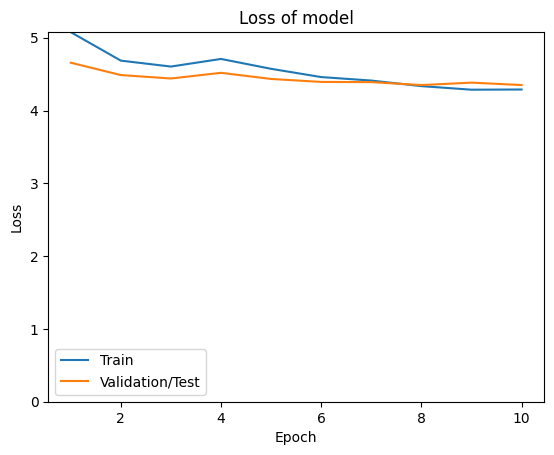

In [107]:
epochs = 10
hist_no_tf = train(model_no_tf, train_loader, val_loader, criterion, optimizer, epochs, device)
plot_history(hist_no_tf)

<Figure size 800x1800 with 0 Axes>

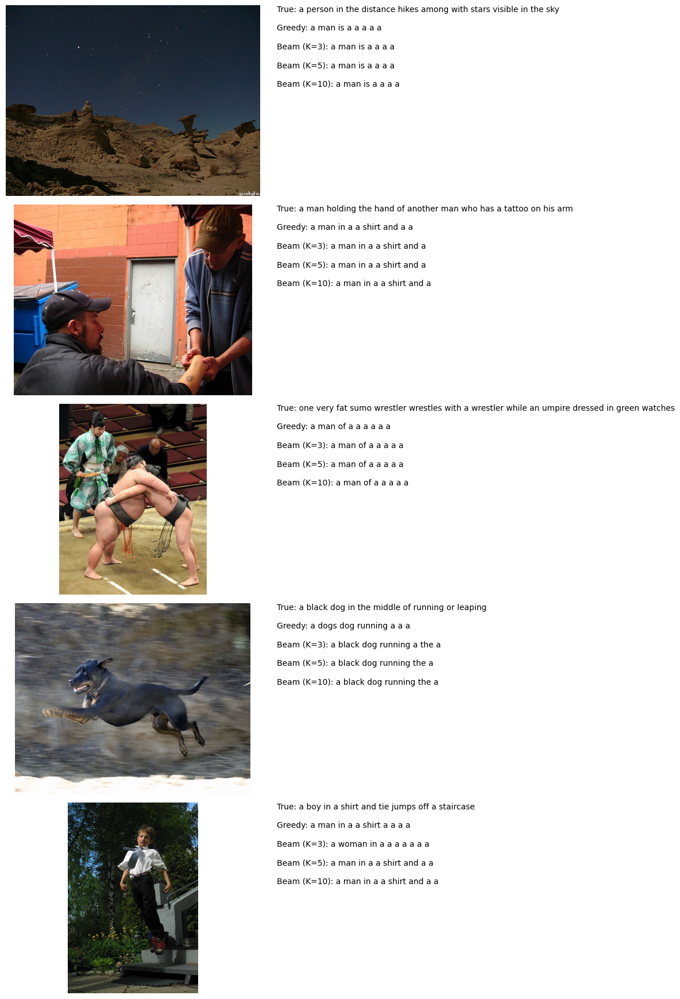

In [ ]:
beam_widths = [3,5,10]
nsample = 5
max_new_tokens = tokenizer.context_length+3
plot_generations(model_no_tf, tokenizer, beam_widths, nsample, val_dataset, max_new_tokens)

## <a id='toc6_'></a>[Use a smaller dictionary](#toc0_)

In [ ]:
small_tokenizer = Tokenizer(train_captions,unknown_percent=0.5)
len_dictionary = len(small_tokenizer.dictionary)
len_unk = len(small_tokenizer.unknown_words)
total_tokens = small_tokenizer.total_tokens
total_unknown_tokens = small_tokenizer.total_unknown_tokens
print("Numer of unqiue tokens in captions:",len_dictionary+len_unk)
print("Numer of tokens in dictionary:",len_dictionary)
print("Numer of unknown words in captions:",len_unk)
print("Percent of unknown tokens to all tokens:",len_unk*100/(len_dictionary+len_unk))
print("Percent of unknown tokens to all tokens in captions:",total_unknown_tokens*100/total_tokens)
print("List of some unknown words in captions:",small_tokenizer.unknown_words[-10:])

Numer of unqiue tokens in captions: 8536
Numer of tokens in dictionary: 3847
Numer of unknown words in captions: 4689
Percent of unknown tokens to all tokens: 54.93205248359887
Percent of unknown tokens to all tokens in captions: 1.6772058591994412
List of some unknown words in captions: [('trim', 2), ('tortoise', 2), ('search', 2), ('shutters', 2), ('gea', 2), ('refreshment', 2), ('tambourines', 2), ('vintage', 2), ('fedex', 2), ('simpsons', 2)]


In [ ]:
small_train_dataset = Flickr8kDataset(os.path.join(path,"Images"),train_captions,small_tokenizer,transform = transform)
small_val_dataset = Flickr8kDataset(os.path.join(path,"Images"),val_captions,small_tokenizer,transform = transform)
small_test_dataset = Flickr8kDataset(os.path.join(path,"Images"),test_captions,small_tokenizer,transform = transform)

In [ ]:
small_train_loader = DataLoader(
    small_train_dataset,
    batch_size=batch_size,
    shuffle=True)
small_val_loader = DataLoader(
    small_val_dataset,
    batch_size=batch_size,
    shuffle=False)

In [ ]:
vocab_size = len(small_tokenizer.dictionary)
embedding_dim = 50
hidden_size = 2048
small_model = HybridModel(vocab_size,embedding_dim,hidden_size,device).to(device)

In [ ]:
optimizer = torch.optim.Adam(small_model.parameters(), lr=learning_rate)
criterion = nn.CrossEntropyLoss(ignore_index=small_tokenizer.dictionary[special_tokens.Pad])

Epoch [1] Average Training Loss: 4.6858
Epoch [1] Average Validation Loss: 3.7559
Epoch [2] Average Training Loss: 3.8038
Epoch [2] Average Validation Loss: 3.3690
Epoch [3] Average Training Loss: 3.5354
Epoch [3] Average Validation Loss: 3.2775
Epoch [4] Average Training Loss: 3.3890
Epoch [4] Average Validation Loss: 3.1477
Epoch [5] Average Training Loss: 3.2418
Epoch [5] Average Validation Loss: 3.0877
Epoch [6] Average Training Loss: 3.1436
Epoch [6] Average Validation Loss: 3.0478
Epoch [7] Average Training Loss: 3.0637
Epoch [7] Average Validation Loss: 2.9939
Epoch [8] Average Training Loss: 2.9850
Epoch [8] Average Validation Loss: 3.0134
Epoch [9] Average Training Loss: 2.9055
Epoch [9] Average Validation Loss: 2.9592
Epoch [10] Average Training Loss: 2.8737
Epoch [10] Average Validation Loss: 3.0165


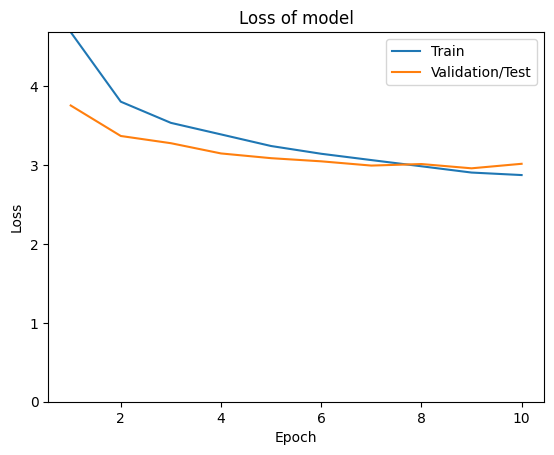

In [ ]:
epochs = 10
small_hist = train(small_model, small_train_loader, small_val_loader, criterion,
                   optimizer, epochs, device)
plot_history(small_hist)

In [ ]:
torch.save(model.state_dict(), path+"model")
torch.save(model_with_dropout.state_dict(), path+"model_with_dropout")
torch.save(small_model.state_dict(), path+"small_model")

<Figure size 800x1800 with 0 Axes>

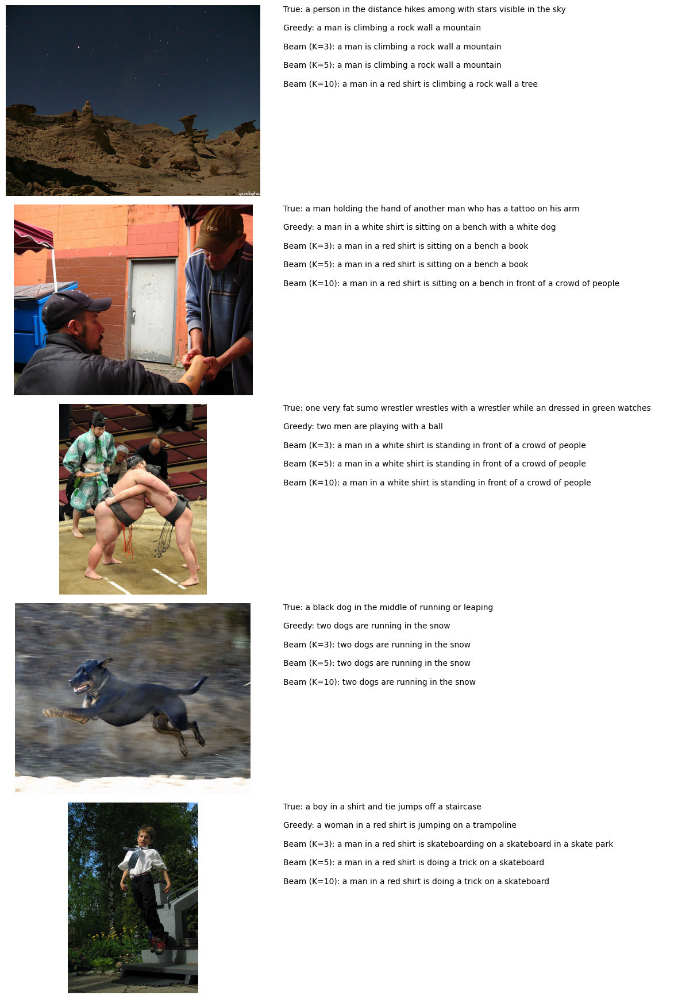

In [ ]:
small_max_new_tokens = small_tokenizer.context_length+3
plot_generations(small_model, small_tokenizer, beam_widths, nsample, small_val_dataset, small_max_new_tokens)

In [ ]:
evaluate(small_model, small_tokenizer, small_val_loader, beam_widths, max_new_tokens)

,Micro Accuracy,Macro Accuracy,BLEU-1,BLEU-2,BLEU-3,BLEU-4
Greedy,0.221242,0.229228,0.551296,0.365600,0.229846,0.147934
Beam K = 3,0.231269,0.238014,0.567192,0.378439,0.245444,0.160100
Beam K = 5,0.230941,0.237559,0.568355,0.382278,0.251422,0.164479
Beam K = 10,0.228382,0.231685,0.560551,0.374397,0.247933,0.162056


## <a id='toc6_1_'></a>[Use embedding of size 150](#toc0_)

In [ ]:
vocab_size = len(tokenizer.dictionary)
embedding_dim = 150
hidden_size = 2048
model1 = HybridModel(vocab_size,embedding_dim,hidden_size,device).to(device)

In [ ]:
optimizer = torch.optim.Adam(model1.parameters(), lr=learning_rate)
criterion = nn.CrossEntropyLoss(ignore_index=tokenizer.dictionary[special_tokens.Pad])

Epoch [1] Average Training Loss: 4.2924
Epoch [1] Average Validation Loss: 3.4725
Epoch [2] Average Training Loss: 3.5904
Epoch [2] Average Validation Loss: 3.2128
Epoch [3] Average Training Loss: 3.3323
Epoch [3] Average Validation Loss: 3.0937
Epoch [4] Average Training Loss: 3.2045
Epoch [4] Average Validation Loss: 3.0345
Epoch [5] Average Training Loss: 3.0732
Epoch [5] Average Validation Loss: 3.0463
Epoch [6] Average Training Loss: 3.0193
Epoch [6] Average Validation Loss: 2.9694
Epoch [7] Average Training Loss: 2.9598
Epoch [7] Average Validation Loss: 2.9595
Epoch [8] Average Training Loss: 2.8514
Epoch [8] Average Validation Loss: 2.9662
Epoch [9] Average Training Loss: 2.7743
Epoch [9] Average Validation Loss: 2.9541
Epoch [10] Average Training Loss: 2.7450
Epoch [10] Average Validation Loss: 2.9578


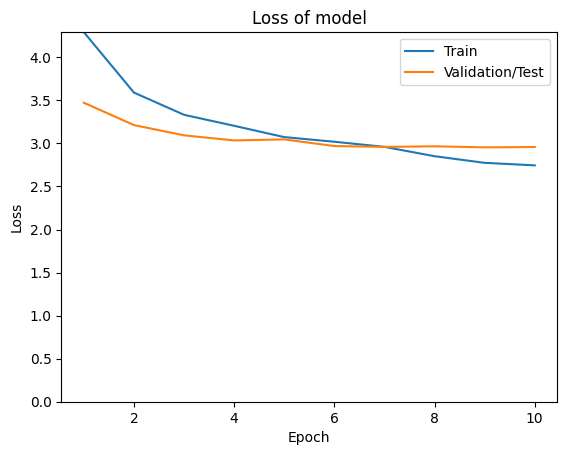

In [ ]:
hist1 = train(model1, train_loader, val_loader, criterion, optimizer, epochs, device)
torch.save(model1.state_dict(), path+"model150")
plot_history(hist1)

<Figure size 800x1800 with 0 Axes>

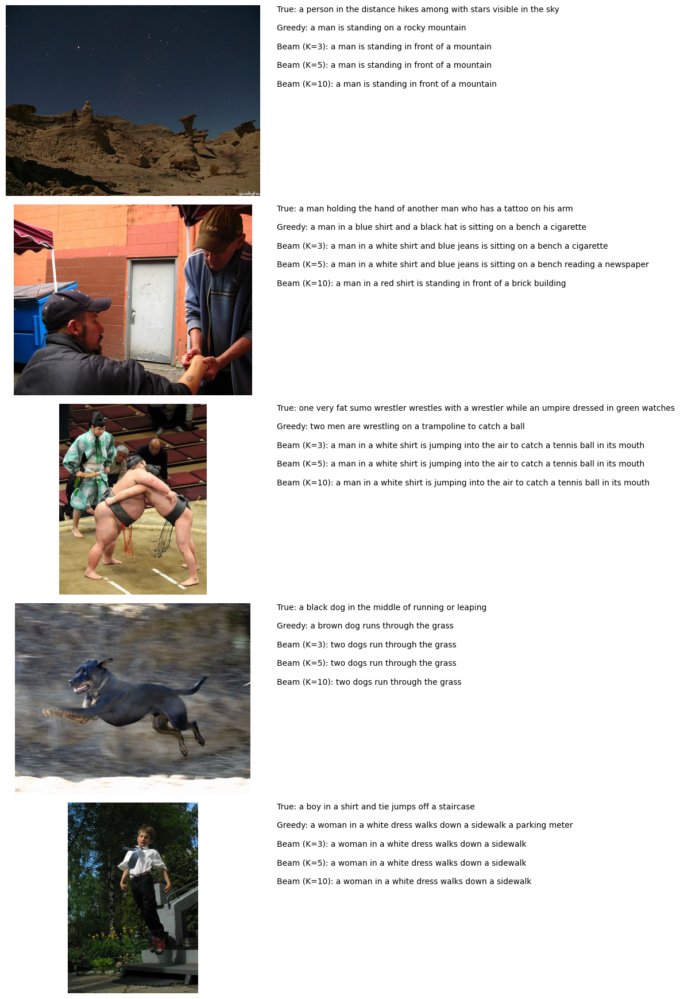

In [ ]:
max_new_tokens = tokenizer.context_length+3
plot_generations(model1, tokenizer, beam_widths, nsample, val_dataset, max_new_tokens)

In [ ]:
evaluate(model1, tokenizer, val_loader, beam_widths, max_new_tokens)

,Micro Accuracy,Macro Accuracy,BLEU-1,BLEU-2,BLEU-3,BLEU-4
Greedy,0.229487,0.237735,0.536161,0.348303,0.218271,0.140908
Beam K = 3,0.231479,0.240317,0.557379,0.370610,0.238766,0.157959
Beam K = 5,0.229925,0.238243,0.558502,0.370435,0.238130,0.157404
Beam K = 10,0.229560,0.237379,0.553082,0.369200,0.238274,0.159581


## <a id='toc6_2_'></a>[Use embedding of size 300](#toc0_)

In [ ]:
vocab_size = len(tokenizer.dictionary)
embedding_dim = 300
hidden_size = 2048
model2 = HybridModel(vocab_size,embedding_dim,hidden_size,device).to(device)

In [ ]:
optimizer = torch.optim.Adam(model2.parameters(), lr=learning_rate)
criterion = nn.CrossEntropyLoss(ignore_index=tokenizer.dictionary[special_tokens.Pad])

Epoch [1] Average Training Loss: 4.2325
Epoch [1] Average Validation Loss: 3.4146
Epoch [2] Average Training Loss: 3.5391
Epoch [2] Average Validation Loss: 3.1721
Epoch [3] Average Training Loss: 3.2873
Epoch [3] Average Validation Loss: 3.0897
Epoch [4] Average Training Loss: 3.1801
Epoch [4] Average Validation Loss: 3.0018
Epoch [5] Average Training Loss: 3.0361
Epoch [5] Average Validation Loss: 3.0246
Epoch [6] Average Training Loss: 2.9919
Epoch [6] Average Validation Loss: 2.9932
Epoch [7] Average Training Loss: 2.9831
Epoch [7] Average Validation Loss: 2.9807
Epoch [8] Average Training Loss: 2.8718
Epoch [8] Average Validation Loss: 2.9527
Epoch [9] Average Training Loss: 2.7991
Epoch [9] Average Validation Loss: 2.9396
Epoch [10] Average Training Loss: 2.7261
Epoch [10] Average Validation Loss: 2.9421


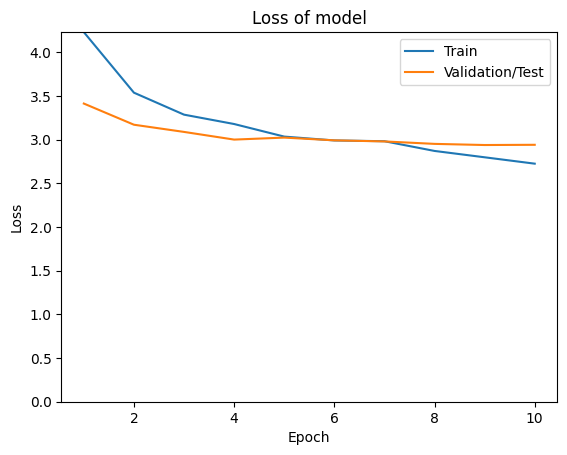

In [ ]:
hist2 = train(model2, train_loader, val_loader, criterion, optimizer, epochs, device)
plot_history(hist2)

<Figure size 800x1800 with 0 Axes>

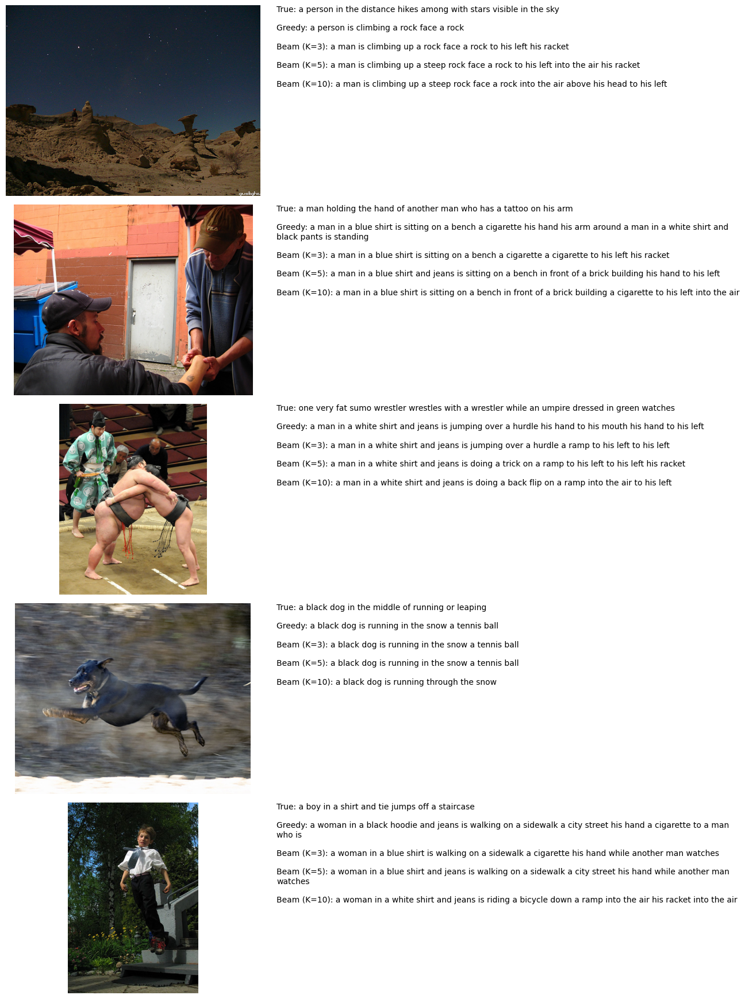

In [ ]:
beam_widths = [3,5,10]
nsample = 5
max_new_tokens = tokenizer.context_length+3
plot_generations(model2, tokenizer, beam_widths, nsample, val_dataset, max_new_tokens)

In [ ]:
evaluate(model2, tokenizer, val_loader, beam_widths, max_new_tokens)

,Micro Accuracy,Macro Accuracy,BLEU-1,BLEU-2,BLEU-3,BLEU-4
Greedy,0.226392,0.236276,0.461385,0.295351,0.182981,0.115586
Beam K = 3,0.231373,0.240192,0.458475,0.293568,0.188023,0.120045
Beam K = 5,0.228925,0.238368,0.454495,0.289496,0.185276,0.118703
Beam K = 10,0.225481,0.233207,0.457976,0.291854,0.183927,0.118617


## <a id='toc7_'></a>[Train on validation dataset for 40 epochs](#toc0_)

In [ ]:
vocab_size = len(tokenizer.dictionary)
embedding_dim = 50
hidden_size = 2048
model40_epochs = HybridModel(vocab_size,embedding_dim,hidden_size,device).to(device)

In [ ]:
optimizer = torch.optim.Adam(model40_epochs.parameters(), lr=learning_rate)
criterion = nn.CrossEntropyLoss(ignore_index=tokenizer.dictionary[special_tokens.Pad])

Epoch [1] Average Training Loss: 4.5498
Epoch [1] Average Validation Loss: 3.6894
Epoch [2] Average Training Loss: 3.8107
Epoch [2] Average Validation Loss: 3.4572
Epoch [3] Average Training Loss: 3.5783
Epoch [3] Average Validation Loss: 3.2413
Epoch [4] Average Training Loss: 3.3613
Epoch [4] Average Validation Loss: 3.1485
Epoch [5] Average Training Loss: 3.2258
Epoch [5] Average Validation Loss: 3.0957
Epoch [6] Average Training Loss: 3.2100
Epoch [6] Average Validation Loss: 3.0896
Epoch [7] Average Training Loss: 3.0526
Epoch [7] Average Validation Loss: 3.0527
Epoch [8] Average Training Loss: 3.0058
Epoch [8] Average Validation Loss: 3.0970
Epoch [9] Average Training Loss: 3.0204
Epoch [9] Average Validation Loss: 3.0349
Epoch [10] Average Training Loss: 2.9910
Epoch [10] Average Validation Loss: 3.0337
Epoch [11] Average Training Loss: 2.8434
Epoch [11] Average Validation Loss: 3.0173
Epoch [12] Average Training Loss: 2.7659
Epoch [12] Average Validation Loss: 3.0151
Epoch [13]

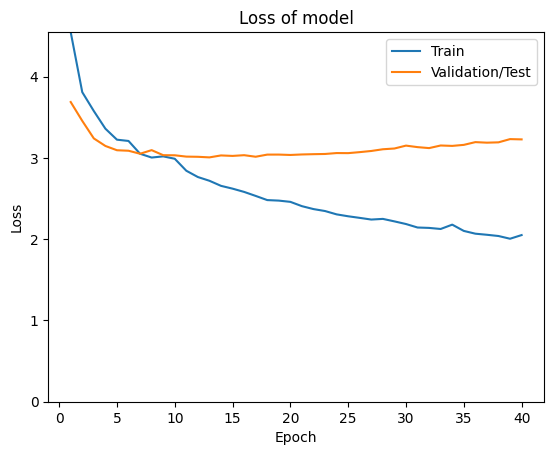

In [ ]:
epochs = 40
hist1 = train(model40_epochs, train_loader, val_loader, criterion, optimizer, epochs, device)
plot_history(hist1)

<Figure size 800x1800 with 0 Axes>

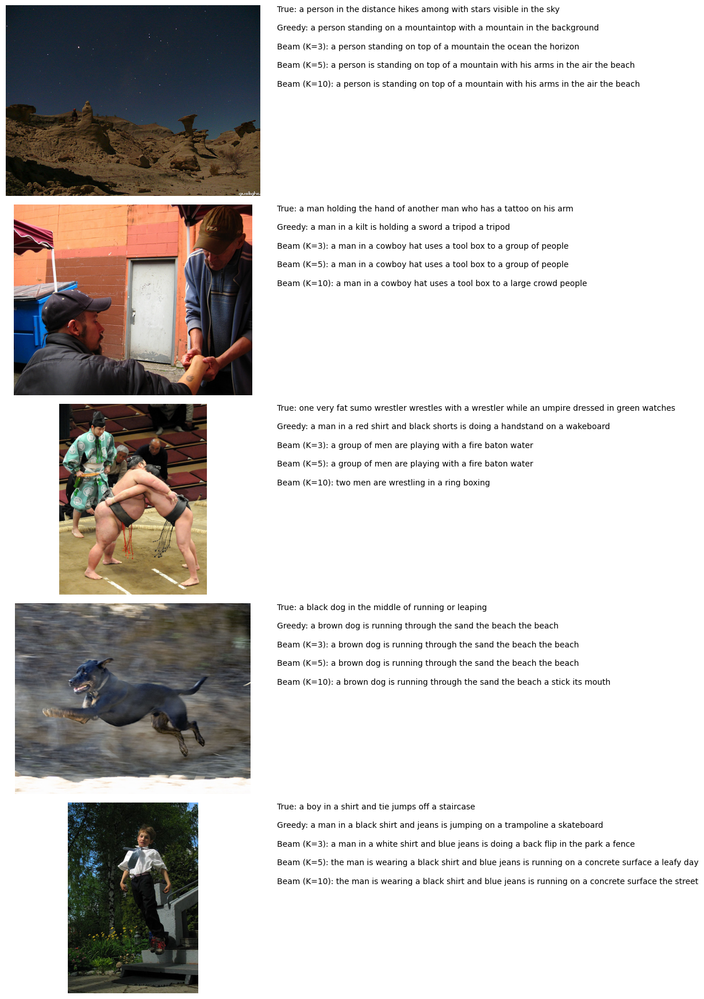

In [ ]:
max_new_tokens = tokenizer.context_length+3
plot_generations(model40_epochs, tokenizer, beam_widths, nsample, val_dataset, max_new_tokens)

In [ ]:
evaluate(model40_epochs, tokenizer, val_loader, beam_widths, max_new_tokens)

,Micro Accuracy,Macro Accuracy,BLEU-1,BLEU-2,BLEU-3,BLEU-4
Greedy,0.225810,0.235044,0.538645,0.341239,0.208188,0.130445
Beam K = 3,0.233323,0.242256,0.522502,0.334616,0.210917,0.132750
Beam K = 5,0.229185,0.238734,0.512771,0.326633,0.203052,0.128074
Beam K = 10,0.229237,0.236271,0.500319,0.318688,0.200355,0.126136


# <a id='toc8_'></a>[Evaluate on test dataset](#toc0_)

In [44]:
train_val_dataset = ConcatDataset([train_dataset, val_dataset])
train_val_loader = DataLoader(
    train_val_dataset,
    batch_size=batch_size,
    shuffle=True)
test_loader = DataLoader(
    test_dataset,
    batch_size=batch_size,
    shuffle=False)

In [45]:
vocab_size = len(tokenizer.dictionary)
embedding_dim = 50
hidden_size = 2048
final_model = HybridModel(vocab_size,embedding_dim,hidden_size,device).to(device)

In [46]:
optimizer = torch.optim.Adam(final_model.parameters(), lr=learning_rate)
criterion = nn.CrossEntropyLoss(ignore_index=tokenizer.dictionary[special_tokens.Pad])

Epoch [1] Average Training Loss: 4.4425
Epoch [1] Average Validation Loss: 3.6340
Epoch [2] Average Training Loss: 3.7266
Epoch [2] Average Validation Loss: 3.3638
Epoch [3] Average Training Loss: 3.4648
Epoch [3] Average Validation Loss: 3.2142
Epoch [4] Average Training Loss: 3.3463
Epoch [4] Average Validation Loss: 3.1565
Epoch [5] Average Training Loss: 3.1896
Epoch [5] Average Validation Loss: 3.0721
Epoch [6] Average Training Loss: 3.0845
Epoch [6] Average Validation Loss: 3.0239
Epoch [7] Average Training Loss: 2.9799
Epoch [7] Average Validation Loss: 3.0305
Epoch [8] Average Training Loss: 2.9042
Epoch [8] Average Validation Loss: 2.9867
Epoch [9] Average Training Loss: 2.8218
Epoch [9] Average Validation Loss: 2.9783
Epoch [10] Average Training Loss: 2.7674
Epoch [10] Average Validation Loss: 2.9917
Epoch [11] Average Training Loss: 2.6960
Epoch [11] Average Validation Loss: 2.9866
Epoch [12] Average Training Loss: 2.7646
Epoch [12] Average Validation Loss: 3.0455
Epoch [13]

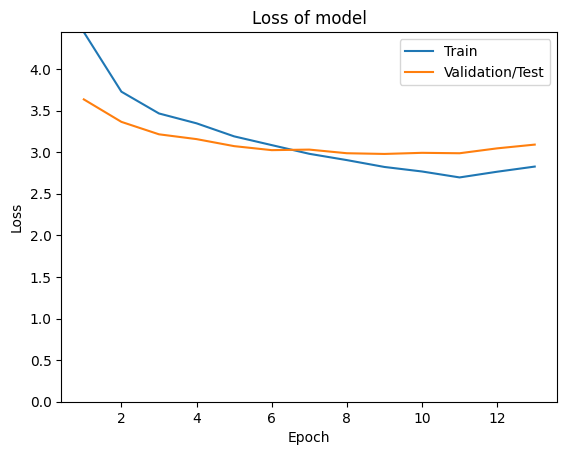

In [47]:
epochs = 13
final_hist = train(final_model, train_val_loader, test_loader, criterion, optimizer, 
                   epochs, device)
plot_history(final_hist)

<Figure size 800x1800 with 0 Axes>

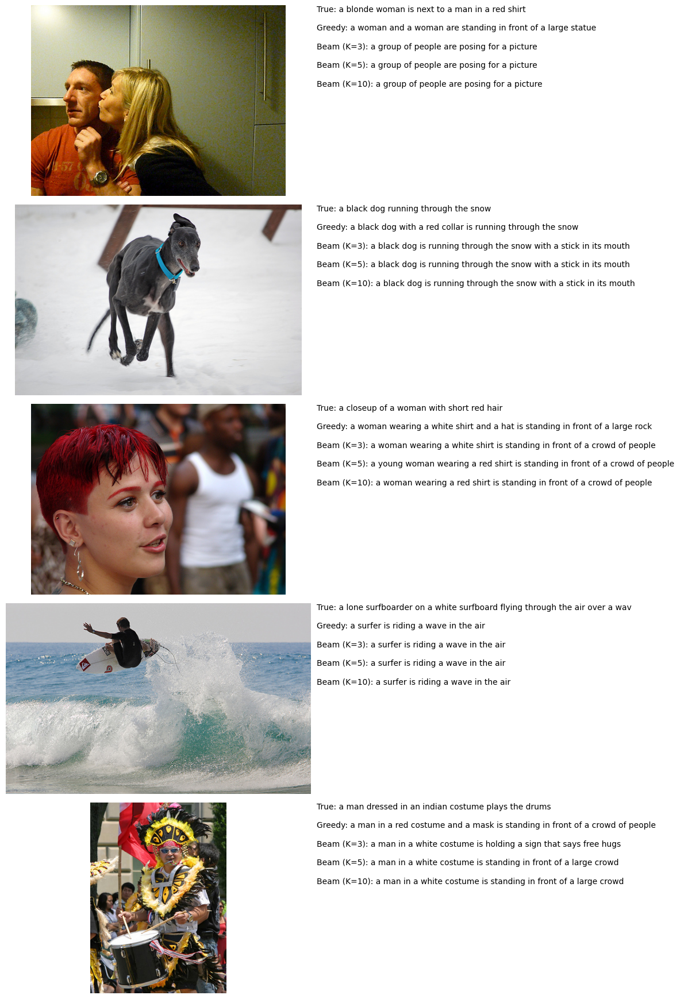

In [50]:
beam_widths = [3,5,10]
nsample = 5
max_new_tokens = tokenizer.context_length+3
plot_generations(final_model, tokenizer, beam_widths, nsample, test_dataset, max_new_tokens)

In [51]:
evaluate(final_model, tokenizer, test_loader, beam_widths, max_new_tokens)

,Micro Accuracy,Macro Accuracy,BLEU-1,BLEU-2,BLEU-3,BLEU-4
Greedy,0.227491,0.235808,0.547871,0.354078,0.224373,0.145220
Beam K = 3,0.233320,0.238600,0.533902,0.347131,0.226561,0.148711
Beam K = 5,0.233440,0.238188,0.533730,0.346716,0.229307,0.152290
Beam K = 10,0.233046,0.238455,0.532819,0.346483,0.229238,0.150687
